In [1]:
import numpy as np
import pickle
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import ramanspy as rp
from scipy.signal import find_peaks
import seaborn as sns

# importing data

In [2]:
def save_figure(filename):
    """
    Saves the current matplotlib figure as a PNG file.
    
    Args:
        filename (str): The name of the file (with or without .png extension).
    """
    if not filename.lower().endswith('.png'):
        filename += '.png'
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved as: {filename}")

In [3]:
files = "spectrum_data_salt_week2" #spectral_data_filename.npy'leri kaydettiğin klasör. 
#NOT: KODUN DÜZGÜN ÇALIŞMASI İÇİN KLASÖRÜN İÇİNDE ANALİZ EDİLECEK SPEKTRAL DATALARDAN BAŞKA BİR ŞEY OLMAMALI
spectral_dicts={"week2": {"control":[],"50":[],"100":[],"150":[], "200": []}, 
                "week4": {"control":[],"50":[],"100":[],"150":[], "200": []}}




for file_name in os.listdir(files):
    file_path = os.path.join(files, file_name)
    if os.path.isfile(file_path):
        with open(file_path, 'r') as file:
            print(file_name)
            if "Control" in file_name:
                spectral_dicts["week2"]["control"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            elif "Salt50" in file_name:
                spectral_dicts["week2"]["50"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            elif "Salt100" in file_name:
                spectral_dicts["week2"]["100"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            elif "Salt150" in file_name:
                spectral_dicts["week2"]["150"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            elif "Salt200" in file_name:
                spectral_dicts["week2"]["200"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            
print(len(spectral_dicts["week2"]["control"]))
            

files = "spectrum_data_salt_week4" #spectral_data_filename.npy'leri kaydettiğin klasör. 
#NOT: KODUN DÜZGÜN ÇALIŞMASI İÇİN KLASÖRÜN İÇİNDE ANALİZ EDİLECEK SPEKTRAL DATALARDAN BAŞKA BİR ŞEY OLMAMALI
for file_name in os.listdir(files):
    file_path = os.path.join(files, file_name)
    if os.path.isfile(file_path):
        with open(file_path, 'r') as file:
            print(file_name)
            if "Control" in file_name:
                spectral_dicts["week4"]["control"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            elif "Salt50" in file_name:
                spectral_dicts["week4"]["50"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            elif "Salt100" in file_name:
                spectral_dicts["week4"]["100"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            elif "Salt150" in file_name:
                spectral_dicts["week4"]["150"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            elif "Salt200" in file_name:
                spectral_dicts["week4"]["200"].append(np.load(f"{files}/{file_name}",allow_pickle='TRUE'))
            
print(len(spectral_dicts["week4"]["control"]))


spectral_data_R-T_Wheat_Salt100_2_2.npy
spectral_data_R-T_Wheat_Salt100_2_1.npy
spectral_data_R-T_Wheat_Salt100_1_2.npy
spectral_data_R-T_Wheat_Salt50_2_2.npy
spectral_data_R-T_Wheat_Salt100_1_1.npy
spectral_data_R-T_Wheat_2ndW_Salt50_2_1.npy
spectral_data_R-T_Wheat_Salt150_1_1.npy
spectral_data_R-T_Wheat_2ndW_Control_1_2.npy
spectral_data_R-T_Wheat_Salt200_1_2.npy
spectral_data_R-T_Wheat_Salt150_1_2.npy
spectral_data_R-T_Wheat_2ndW_Control_1_1.npy
spectral_data_R-T_Wheat_Salt200_1_1.npy
spectral_data_R-T_Wheat_2ndW_Salt50_1_1.npy
spectral_data_R-T_Wheat_2ndW_Salt50_1_2.npy
spectral_data_R-T_Wheat_Salt200_2_2.npy
spectral_data_R-T_Wheat_2ndW_Control_2_2.npy
spectral_data_R-T_Wheat_Salt150_2_1.npy
spectral_data_R-T_Wheat_Salt200_2_1.npy
spectral_data_R-T_Wheat_2ndW_Control_2_1.npy
spectral_data_R-T_Wheat_Salt150_2_2.npy
4
spectral_data_R-T_Wheat_Control_2_2.npy
spectral_data_R-T_Wheat_Salt100_2_2.npy
spectral_data_R-T_Wheat_Salt50_1_1.npy
spectral_data_R-T_Wheat_Control_2_1.npy
spectral

In [4]:
files = "spectrums_salt_week2" #spectral_data_filename.npy'leri kaydettiğin klasör. 
#NOT: KODUN DÜZGÜN ÇALIŞMASI İÇİN KLASÖRÜN İÇİNDE ANALİZ EDİLECEK SPEKTRAL DATALARDAN BAŞKA BİR ŞEY OLMAMALI
spectrums={"week2": {"control":[],"50":[],"100":[],"150":[], "200": []}, 
            "week4": {"control":[],"50":[],"100":[],"150":[], "200": []}}
for file_name in os.listdir(files):
    file_path = os.path.join(files, file_name)
    if os.path.isfile(file_path):
        with open(file_path, 'r') as file:
            print(file_name)
            spect = np.load(f"{files}/{file_name}",allow_pickle='TRUE')
            spect = spect.reshape(spect.shape[0]*spect.shape[1],1140)

            if "Control" in file_name:
                spectrums["week2"]["control"].extend(spect)
            elif "Salt50" in file_name:
                spectrums["week2"]["50"].extend(spect)
            elif "Salt100" in file_name:
                spectrums["week2"]["100"].extend(spect)
            elif "Salt150" in file_name:
                spectrums["week2"]["150"].extend(spect)
            elif "Salt200" in file_name:
                spectrums["week2"]["200"].extend(spect)

#loading 4th week data
files = "spectrums_salt_week4" #spectral_data_filename.npy'leri kaydettiğin klasör. 
#NOT: KODUN DÜZGÜN ÇALIŞMASI İÇİN KLASÖRÜN İÇİNDE ANALİZ EDİLECEK SPEKTRAL DATALARDAN BAŞKA BİR ŞEY OLMAMALI
for file_name in os.listdir(files):
    file_path = os.path.join(files, file_name)
    if os.path.isfile(file_path):
        with open(file_path, 'r') as file:
            print(file_name)
            spect = np.load(f"{files}/{file_name}",allow_pickle='TRUE')
            spect = spect.reshape(spect.shape[0]*spect.shape[1],1140)

            if "Control" in file_name:
                spectrums["week4"]["control"].extend(spect)
            elif "Salt50" in file_name:
                spectrums["week4"]["50"].extend(spect)
            elif "Salt100" in file_name:
                spectrums["week4"]["100"].extend(spect)
            elif "Salt150" in file_name:
                spectrums["week4"]["150"].extend(spect)
            elif "Salt200" in file_name:
                spectrums["week4"]["200"].extend(spect)

         

spectrumsR-T_Wheat_2ndW_Control_1_2.npy
spectrumsR-T_Wheat_Salt100_2_2.npy
spectrumsR-T_Wheat_2ndW_Control_1_1.npy
spectrumsR-T_Wheat_Salt100_2_1.npy
spectrumsR-T_Wheat_Salt50_2_2.npy
spectrumsR-T_Wheat_Salt100_1_2.npy
spectrumsR-T_Wheat_2ndW_Control_2_2.npy
spectrumsR-T_Wheat_Salt100_1_1.npy
spectrumsR-T_Wheat_2ndW_Control_2_1.npy
spectrumsR-T_Wheat_2ndW_Salt50_2_1.npy
spectrumsR-T_Wheat_Salt150_1_1.npy
spectrumsR-T_Wheat_Salt200_1_2.npy
spectrumsR-T_Wheat_Salt150_1_2.npy
spectrumsR-T_Wheat_Salt200_1_1.npy
spectrumsR-T_Wheat_2ndW_Salt50_1_2.npy
spectrumsR-T_Wheat_2ndW_Salt50_1_1.npy
spectrumsR-T_Wheat_Salt200_2_2.npy
spectrumsR-T_Wheat_Salt150_2_1.npy
spectrumsR-T_Wheat_Salt200_2_1.npy
spectrumsR-T_Wheat_Salt150_2_2.npy
spectrumsR-T_Wheat_Salt50_1_2.npy
spectrumsR-T_Wheat_Salt50_1_1.npy
spectrumsR-T_Wheat_Control_2_2.npy
spectrumsR-T_Wheat_Salt100_2_2.npy
spectrumsR-T_Wheat_Control_2_1.npy
spectrumsR-T_Wheat_Salt100_2_1.npy
spectrumsR-T_Wheat_Salt50_2_2.npy
spectrumsR-T_Wheat_Salt50_2

In [5]:
print(len(spectrums["week2"]["control"]))

780


# preprocessing and creating pandas dataframes

In [6]:
new_spectral_axis = np.arange(660,1800)

In [7]:
#aynı grubun spektrumlarının ortalamsını bul
total_spect_per_group = {"week2": {}, "week4": {}}
total_peaks = {"week2": {}, "week4" : {}}
for group in spectral_dicts["week2"]:
    y=np.zeros(len(new_spectral_axis))
    print(len(spectral_dicts["week2"][group]))
    for i in range(len(spectral_dicts["week2"][group])):
        y = y + spectral_dicts["week2"][group][i]
    #find avg
    print(len(y))
    total_spect_per_group["week2"][group] = y/len(spectral_dicts["week2"][group])
    
    print(len(total_spect_per_group["week2"][group]))
    peaks, _ = find_peaks(total_spect_per_group["week2"][group])
    total_peaks["week2"][group] = peaks + 660
    print(total_peaks["week2"][group])

# do same thing for week 4
total_spect_per_group_2 = {}
total_peaks_2 = {}
for group in spectral_dicts["week4"]:
    y=np.zeros(len(new_spectral_axis))
    for i in range(len(spectral_dicts["week4"][group])):
        y = y + spectral_dicts["week4"][group][i]
    #find avg
    total_spect_per_group["week4"][group] = y/len(spectral_dicts["week4"][group])
    peaks, _ = find_peaks(total_spect_per_group["week4"][group])
    total_peaks["week4"][group] = peaks + 660
    print(total_peaks["week4"][group])
print(total_spect_per_group["week4"])

4
1140
1140
[ 736  819  868  948  986  996 1027 1058 1070 1104 1248 1284 1322 1373
 1409 1438 1493 1505 1562 1577 1636 1672 1689 1724 1787]
4
1140
1140
[ 736  819  865  948  986  996 1027 1057 1064 1071 1104 1248 1286 1322
 1372 1412 1438 1505 1562 1577 1637 1674 1689 1724 1787]
4
1140
1140
[ 736  819  844  865  948  986 1020 1064 1070 1104 1246 1321 1357 1372
 1437 1517 1577 1637 1660 1689 1701 1724 1787]
4
1140
1140
[ 736  819  844  865  948  986  996 1020 1071 1104 1246 1284 1322 1372
 1413 1438 1505 1517 1577 1607 1637 1660 1672 1689 1701 1724 1787]
4
1140
1140
[ 737  819  865  948  986 1026 1070 1104 1187 1226 1248 1284 1322 1373
 1438 1520 1577 1610 1622 1637 1660 1674 1689 1701 1724 1787]
[ 736  822  865  948  996 1057 1064 1104 1249 1286 1322 1372 1435 1511
 1580 1636 1674 1692 1781 1787]
[ 739  822  865  948  996 1057 1063 1104 1249 1284 1303 1322 1372 1437
 1514 1583 1636 1674 1692 1701 1724 1781 1790]
[ 736  822  865  948  996 1057 1063 1070 1104 1249 1286 1322 1372 1437
 14

In [8]:
#create data that contains group and week information

data_all = []
long_data = []
peaks_all = []

for group in total_spect_per_group["week2"]:
    data_all.append([group, "week2", total_spect_per_group["week2"][group]])
    peaks_all.append([group, "week2", total_peaks["week2"][group]])
    
    data_all.append([group, "week4", total_spect_per_group["week4"][group]])
    peaks_all.append([group, "week4", total_peaks["week4"][group]])
    for val in total_spect_per_group["week2"][group]:
        long_data.append({"group": group, "week": "week2", "intensity": val})

    for val in total_spect_per_group["week4"][group]:
        long_data.append({"group": group, "week": "week4", "intensity": val})
    


df_data = pd.DataFrame(data_all, columns=["group", "week", "spectra"])
df_long = pd.DataFrame(long_data)
df_peaks = pd.DataFrame(peaks_all, columns=["group", "week", "peaks"])

In [9]:
df_data

,group,week,spectra
0,control,week2,"[0.0005369812055763286, 0.0005369812055763286,..."
1,control,week4,"[0.0031700457255243565, 0.0031700457255243565,..."
2,50,week2,"[0.0009088875624557759, 0.0009088875624557759,..."
3,50,week4,"[0.003296021923022802, 0.003296021923022802, 0..."
4,100,week2,"[0.0008681539703669307, 0.0008681539703669307,..."
5,100,week4,"[0.0026897831562060423, 0.0026897831562060423,..."
6,150,week2,"[0.001289707160645972, 0.001289707160645972, 0..."
7,150,week4,"[0.002614580092534931, 0.002614580092534931, 0..."
8,200,week2,"[0.0015062316265884329, 0.0015062316265884329,..."
9,200,week4,"[0.003828920115391321, 0.003828920115391321, 0..."


In [10]:
df_cropped = df_data.copy()

In [11]:
len(df_data["spectra"][0])

1140

In [12]:
df_cropped["spectra"] = df_data["spectra"].apply(lambda x: x[20:40])

<h1> spectrum plots

<h2> comparison of spectrums of same group different week

control week2
control week4
50 week2
50 week4
100 week2
100 week4
150 week2
150 week4
200 week2
200 week4
Figure saved as: spectra comp btwn weeks.png


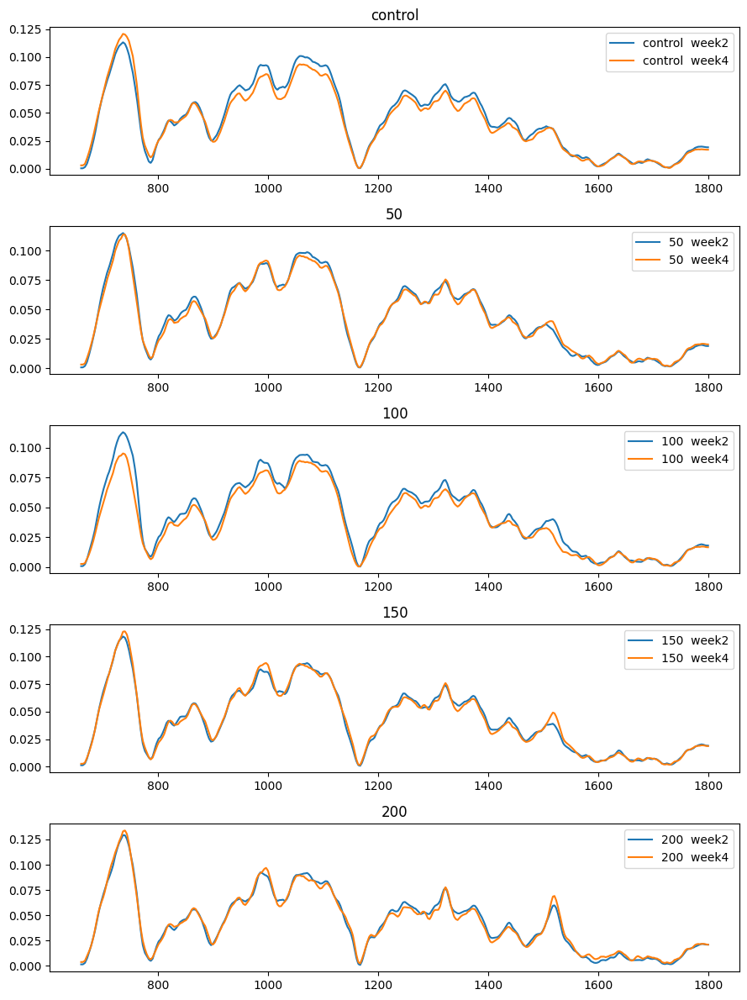

In [13]:
fig, ax = plt.subplots(5, figsize = (9,12))

for i,group in enumerate(df_data["group"].unique()):
    for week in df_data["week"].unique():
        print(group, week)
        y = df_data[(df_data["week"] == week) & (df_data["group"] == group)]["spectra"].to_numpy()[0]
        ax[i].plot(new_spectral_axis, y, label = f"{group}  {week}")
        #y_rp = rp.Spectrum(y, new_spectral_axis)
        #rp.plot.peaks(y_rp, ax = ax[i], label = week)
        ax[i].legend()
    ax[i].set_title(group)
fig.tight_layout()
save_figure("spectra comp btwn weeks")

<h2> comparison of spectrums same week different groups

Figure saved as: spectra_comparison_week2.png


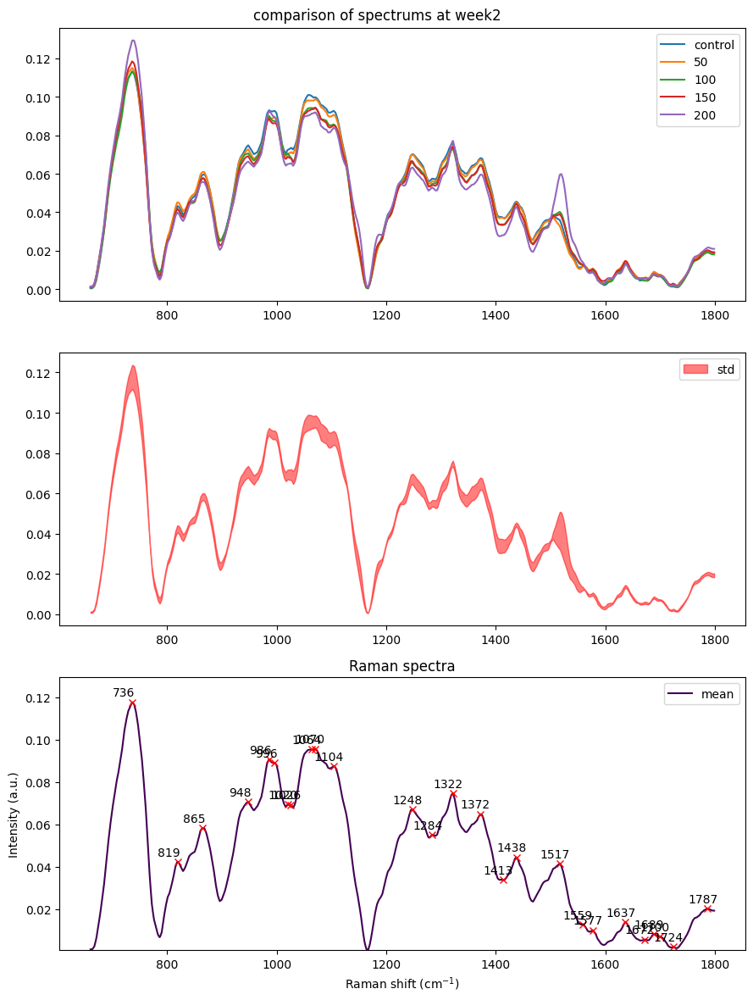

In [14]:
#week2 spectrum compqrisons
#change week variable to analyse different weeks data
week = "week2"

spect_list = list(total_spect_per_group[week].values())
mean = np.mean(spect_list, axis=0)
mean_rp = rp.Spectrum(mean,new_spectral_axis)
std = np.std(spect_list, axis=0)

fig, axis = plt.subplots(3,1, figsize = (9,12))
for group in total_spect_per_group[week]: 

    x = new_spectral_axis
    y = total_spect_per_group[week][group]
    x_p = total_peaks[week][group]
    y_p = y[x_p-660]
    axis[0].plot(x,y,label=group)


axis[1].fill_between(x,mean-std,mean+std, label="std", color ="red", alpha = 0.5)

rp.plot.peaks(mean_rp, label = "mean")


    
axis[0].legend()
axis[1].legend()
axis[2].legend()

fig.suptitle(f"comparison of spectrums at {week}")
fig.tight_layout()
save_figure(f"spectra_comparison_{week}")
plt.show()



control
914
50
876
100
894
150
919
200
969
Figure saved as: std_groups_week4.png


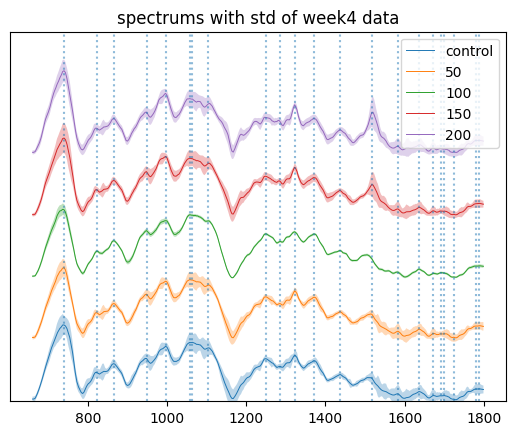

In [15]:
#comparison of spectrums of week4 different groups (shifted in y axis)
#change variable week to analyse different weeks data

week = "week4"

#grupların std plotu
#dotted line da ekle


spect_list = list(total_spect_per_group[week].values())

mean = np.mean(spect_list, axis=0)

peaks = find_peaks(mean)[0] + 660

for i,group in enumerate(spectrums[week]):
    print(group)
    mean_group = np.mean(spectrums[week][group], axis=0) #change to spectrums_2 for week4 data
    std_group = np.std(spectrums[week][group], axis=0)
    print(len(spectrums[week][group]))
    plt.plot(new_spectral_axis, mean_group + i/10, linewidth = 0.7, label = group)
    plt.fill_between(new_spectral_axis,mean_group-std_group + i/10,mean_group+std_group + i/10, alpha = 0.3)

for peak in peaks:
    plt.vlines(peak, 0,0.60, linestyles = "dotted", alpha = 0.5)
    pass

plt.title(f"spectrums with std of {week} data")
plt.yticks([])
plt.legend()
plt.ylim([0,0.60])
save_figure(f"std_groups_{week}")
plt.show()

<h1> violin plots

<h2> violin plots for same week different groups

22
[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]]
4 2
23
4 3
24
4 4
25


/var/folders/nf/nwf8pwq56kl60_ls522kmwgc0000gn/T/ipykernel_1440/4230971822.py:58: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Figure saved as: violin_plots_week4.png


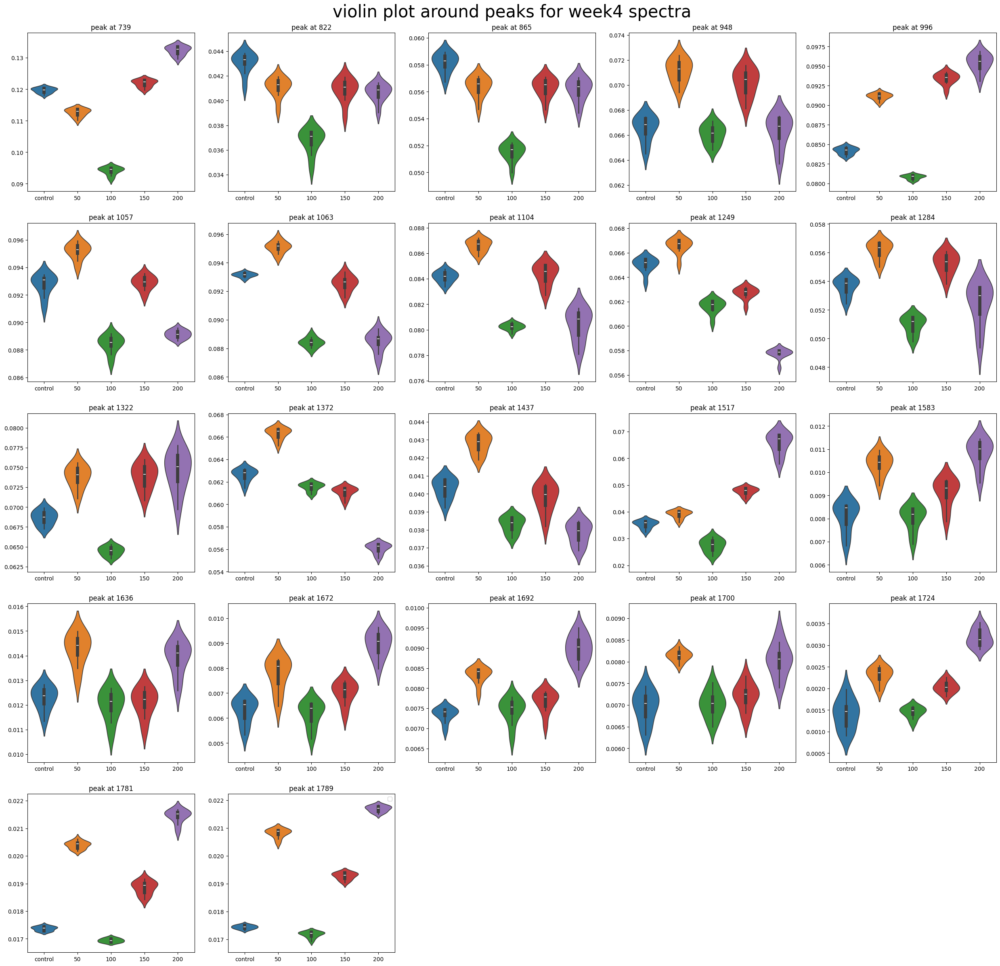

In [16]:
#change week variable to analyse different week data

week = "week4"

df = pd.DataFrame(total_spect_per_group[week])

spect_list = list(total_spect_per_group[week].values())

mean = np.mean(spect_list, axis=0)
peaks = find_peaks(mean)[0]
#extremums = np.sort(np.concatenate((minimas, peaks)))
#peak_indexes = ([int(np.where(extremums==peaks[i])[0][0]) for i in range(len(peaks))])

print(len(peaks))

"""print(extremums)
print(peak_indexes)"""

ncols= 5
nrows= len(peaks) // ncols + 1

cols = np.zeros(ncols)
rows = np.ones(nrows)

a = np.arange(ncols*nrows)  #dummy array a
a = a.reshape(nrows,ncols)
row, col = np.where(a==2)
row, col = row[0], col[0]

print(a)

fig,axes=plt.subplots(nrows,ncols, figsize = (24,24))

for i in range(len(peaks)):
    peak = peaks[i]
    #print(peak, i)

    row, col = np.where(a==i)
    row, col = row[0], col[0]
    
    sns.violinplot(df[peak-5: peak+5], ax= axes[row,col]) # violin plot için
                                                            #seçilen aralığı neye göre seçeceğim    
    axes[row,col].set_title(f"peak at {peak + 660}")



#del unnecessary axes
j = 0
for r in range(nrows):
    for c in range(ncols):
        j += 1
        if j > len(peaks):
            print(r,c)
            print(j)
            fig.delaxes(axes[r, c])


plt.legend()

fig.suptitle(f"violin plot around peaks for {week} spectra",fontsize = 30)
plt.subplots_adjust(left=0, bottom=0, right=1, top=0.95, wspace=0.2, hspace=0.2)
save_figure(f"violin_plots_{week}")
plt.show()


<h2> violin plots including peak shifts

[  76  159  208  288  326  336  367  398  410  444  588  624  662  713
  749  778  833  845  902  917  976 1012 1029 1064 1127]
[  76  159  205  288  326  336  367  397  404  411  444  588  626  662
  712  752  778  845  902  917  977 1014 1029 1064 1127]
[  76  159  184  205  288  326  360  404  410  444  586  661  697  712
  777  857  917  977 1000 1029 1041 1064 1127]
[  76  159  184  205  288  326  336  360  411  444  586  624  662  712
  753  778  845  857  917  947  977 1000 1012 1029 1041 1064 1127]
[  77  159  205  288  326  366  410  444  527  566  588  624  662  713
  778  860  917  950  962  977 1000 1014 1029 1041 1064 1127]


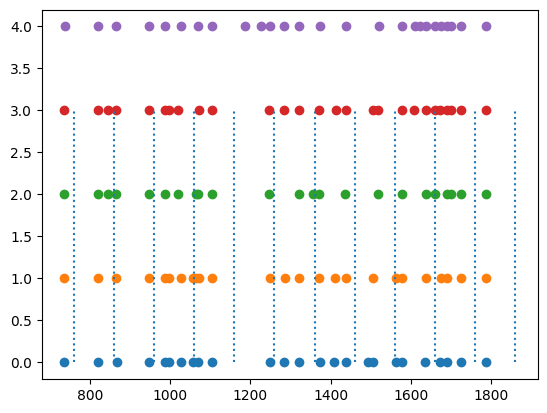

In [17]:
peaks = {}
week = "week2"
for i, group in enumerate(spectral_dicts[week]):
    peaks[group], _ = find_peaks(total_spect_per_group[week][group])
    print(peaks[group])
    plt.scatter(peaks[group] + 660, np.full(len(peaks[group]), i))
for i in range(12):
    plt.vlines(760+100*i,0,3, linestyles = "dotted")

In [18]:
# find closest peaks around a specified point
def closest_peak(peaks_, point): # peaks_ is a dict thats keys is groups
    closest = {}
    for group in peaks_:
        closest[group] = int(peaks_[group][np.abs(peaks_[group] - point).argmin()])
    #print(f"closest peak to {point} is {closest}")
    sorted_dict = dict(sorted(closest.items(), key=lambda item: item[1]))
    return sorted_dict


22
[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]]
Figure saved as: violin_plots_peak_shift_week4.png


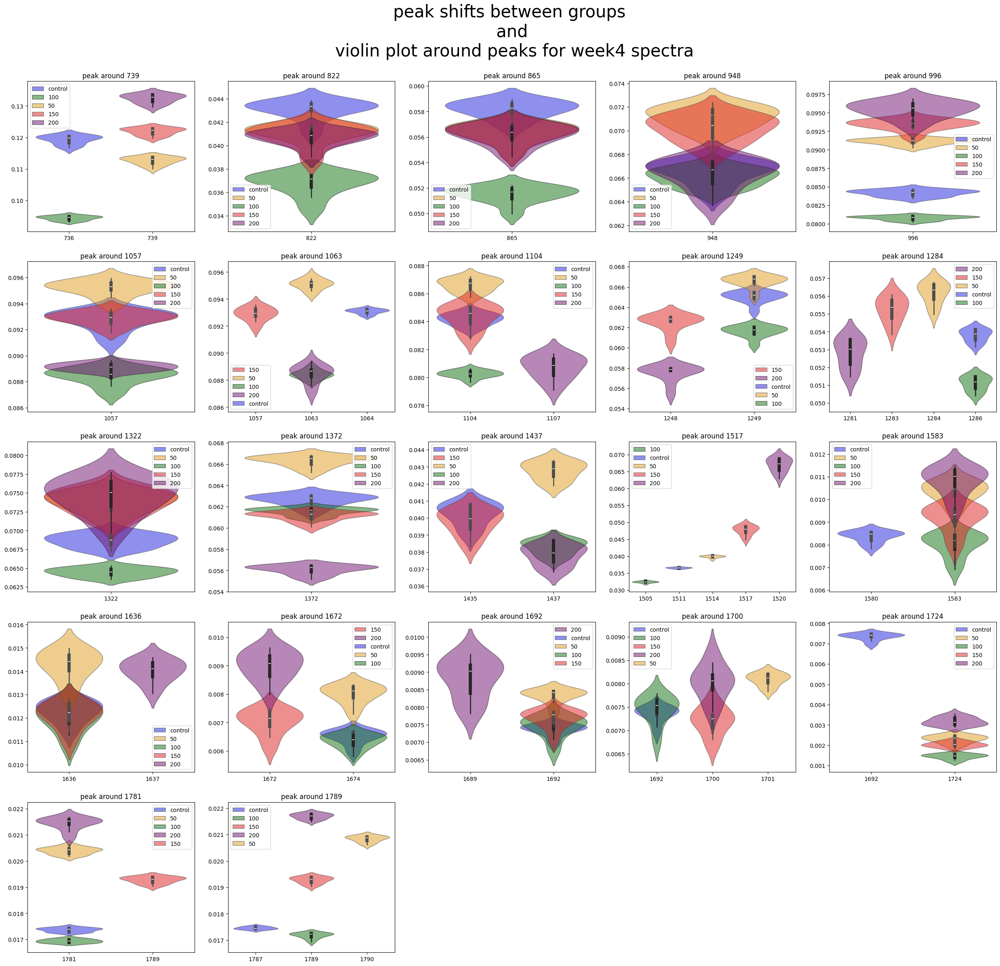

In [19]:
#change variable week to analyse different week

week = "week4"

df = pd.DataFrame(total_spect_per_group[week]) #

spect_list = list(total_spect_per_group[week].values()) #

mean = np.mean(spect_list, axis=0)
peaks = find_peaks(mean)[0]

#minimas = find_peaks(-mean, prominence=0.005)[0]
#extremums = np.sort(np.concatenate((minimas, peaks)))
#peak_indexes = ([int(np.where(extremums==peaks[i])[0][0]) for i in range(len(peaks))])
peaks_group = {}
for i, group in enumerate(spectral_dicts[week]): #
    peaks_group[group] = find_peaks(total_spect_per_group[week][group])[0] #

print(len(peaks))

color_code = {"control": "blue", "50": "orange", "100": "green", "150": "red", "200": "purple"}

"""print(extremums)
print(peak_indexes)"""

ncols= 5
nrows= len(peaks) // ncols + 1

cols = np.zeros(ncols)
rows = np.ones(nrows)

a = np.arange(ncols*nrows)  #dummy array a
a = a.reshape(nrows,ncols)
row, col = np.where(a==2)
row, col = row[0], col[0]

print(a)

fig,axes=plt.subplots(nrows,ncols, figsize = (24,24))

for i in range(len(peaks)):
    peak_mean = peaks[i]
    #print(peak, i)
    peaks_dict = closest_peak(peaks_group, peak_mean) # şu değişkenin ismini daha iyi ayarla peaks_
    row, col = np.where(a==i)
    row, col = row[0], col[0]

    for group in peaks_dict:
        peak = peaks_dict[group]
        sns.violinplot(x = peak + 660, y = df[group][peak-5: peak+5], ax= axes[row,col],
                       label = group, alpha = 0.5, color = color_code[group]) # violin plot için
                                                            #seçilen aralığı neye göre seçeceğim  
    axes[row,col].set_title(f"peak around {peak_mean + 660}")
    axes[row,col].set_ylabel("")



#del unnecessary axes
j = 0
for r in range(nrows):
    for c in range(ncols):
        j += 1
        if j > len(peaks):
            fig.delaxes(axes[r, c])


plt.legend()

fig.suptitle(f"peak shifts between groups \n and \n violin plot around peaks for {week} spectra",fontsize = 30)
plt.subplots_adjust(left=0, bottom=0, right=1, top=0.9, wspace=0.2, hspace=0.2)
save_figure(f"violin_plots_peak_shift_{week}")
plt.show()


# violin plot of multiple week data

In [20]:
#crop the data between a desired interval for x values. 

def create_cropped_long_data(data_Frame, start, stop): # data_Frame is usually df_data
    long_data_cropped = []
    df_cropped["spectra"] = data_Frame["spectra"].apply(lambda x: x[start:stop])
    for idx, row in df_cropped.iterrows():
        group = row["group"]
        week = row["week"]
        for value in row["spectra"]:
            long_data_cropped.append({"group": str(group), "week": week, "intensity": value})

    long_df_cropped = pd.DataFrame(long_data_cropped)
    return long_df_cropped

In [21]:
df_long_20_40 = create_cropped_long_data(df_data,20,40) # for example. this code will crop the data 
# keeping only between 20th and 40th values

In [22]:
df_long_20_40

,group,week,intensity
0,control,week2,0.020279
1,control,week2,0.022253
2,control,week2,0.024316
3,control,week2,0.026518
4,control,week2,0.028721
...,...,...,...
195,200,week4,0.059758
196,200,week4,0.061468
197,200,week4,0.062993
198,200,week4,0.064483


In [23]:
# find closest peaks around a specified point
#modified version for different weeks added
i = 0
def closest_peak_all(peaks_, point): # peaks_ is a pd df thats keys is groups
    closest = []
    for group in peaks_["group"].unique():
        for week in peaks_["week"].unique():  
            print(i)
            peak_arr = np.array(df_peaks[(df_peaks["group"] == group) & (df_peaks["week"] == week)]["peaks"])[0]
            closest.append([group, week, 
                            int(peak_arr[np.abs(peak_arr - point).argmin()])])
    #print(f"closest peak to {point} is {closest}")
    #skip sorting for now
    # sorted_df = dict(sorted(closest.items(), key=lambda item: item[1]))
    closest_df = pd.DataFrame(closest, columns = ["group", "week", "peak"])
    return closest_df

    

24
[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]
 [12 13 14 15]
 [16 17 18 19]
 [20 21 22 23]
 [24 25 26 27]]
6 0
25
6 1
26
6 2
27
6 3
28
Figure saved as: violin_plots_comparison_between weeks.png


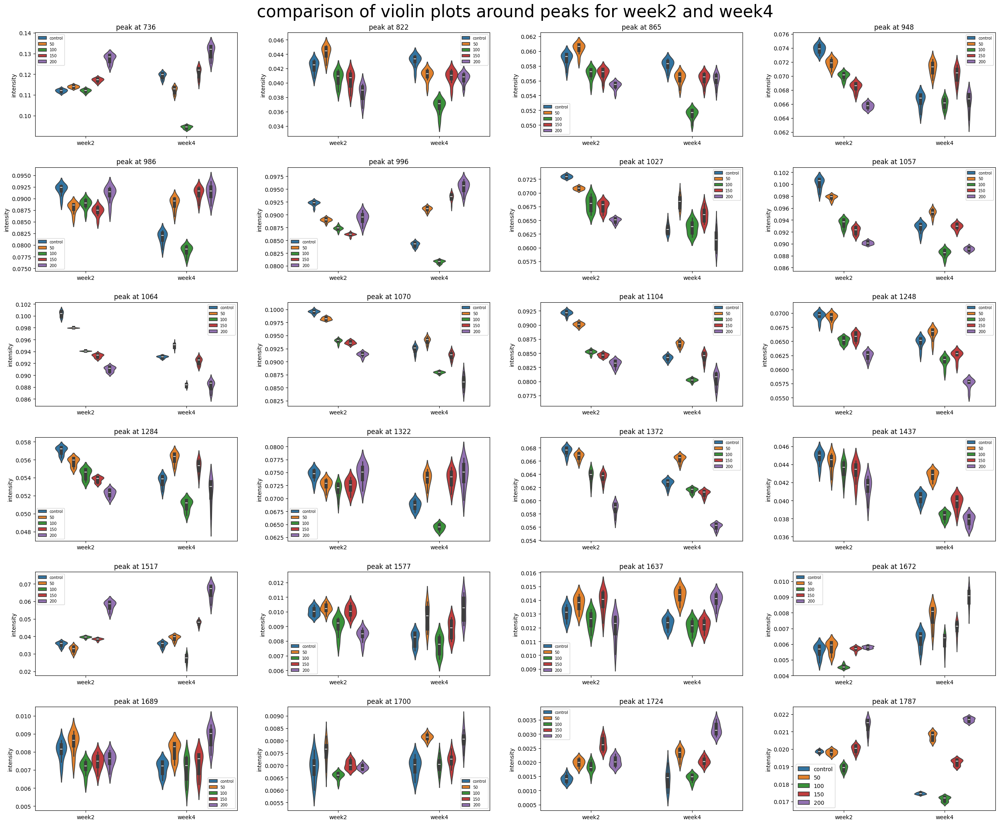

In [24]:
#minimas = find_peaks(-mean, prominence=0.005)[0]
mean_all = np.mean(df_data["spectra"], axis = 0)

peaks = find_peaks(mean_all)[0]
#extremums = np.sort(np.concatenate((minimas, peaks)))
#peak_indexes = ([int(np.where(extremums==peaks[i])[0][0]) for i in range(len(peaks))])

print(len(peaks))

"""print(extremums)
print(peak_indexes)"""

ncols= 4
nrows= len(peaks) // ncols + 1

cols = np.zeros(ncols)
rows = np.ones(nrows)

a = np.arange(ncols*nrows)  #dummy array a
a = a.reshape(nrows,ncols)
row, col = np.where(a==2)
row, col = row[0], col[0]

print(a)

fig,axes=plt.subplots(nrows,ncols, figsize = (24,24))

for i in range(len(peaks)):
    peak = peaks[i]

    row, col = np.where(a==i)
    row, col = row[0], col[0]



    
    df_long_region = create_cropped_long_data(df_data, peak-5, peak+5)
    
    sns.violinplot(x = "week",
                   y = "intensity", 
                   hue = "group",
                   data = df_long_region,
                   width = 0.6,
                   ax= axes[row,col]) # violin plot için
                                                            #seçilen aralığı neye göre seçeceğim    
    axes[row,col].set_title(f"peak at {peak + 660}")
    plt.xlabel("adfb")

    axes[row,col].legend(fontsize = 7)

    axes[row,col].set_xlabel("")




#del unnecessary axes
j = 0
for r in range(nrows):
    for c in range(ncols):
        j += 1
        if j > len(peaks):
            print(r,c)
            print(j)
            fig.delaxes(axes[r, c])


plt.legend()

fig.suptitle("comparison of violin plots around peaks for week2 and week4", fontsize = 30)
plt.subplots_adjust(left=0, bottom=0, right=1, top=0.95, wspace=0.25, hspace=0.3)


save_figure("violin_plots_comparison_between weeks")
plt.show()


# Gaussian fit (still working on it. not complete)

In [58]:
from lmfit import Parameters, Minimizer
from lmfit.models import LorentzianModel,ConstantModel, GaussianModel

In [99]:
def find_peaks_and_shoulders(y, x = new_spectral_axis, p=(0.0005, 0.00005)): # y is an array
    dy = np.diff(y)
    dx = np.diff(x)
    d = dy/dx
    smoothed = savgol_filter(d, window_length=30, polyorder=9)
    shoulders = find_peaks(-smoothed, prominence = p[0])[0]

    peaks_ = find_peaks(y, prominence = p[0])[0]
    shoulders = find_peaks(-smoothed, prominence = p[1])[0]

    peaks_and_shoulders = np.sort(np.concatenate((peaks_,shoulders)))
    return (peaks_and_shoulders, d)

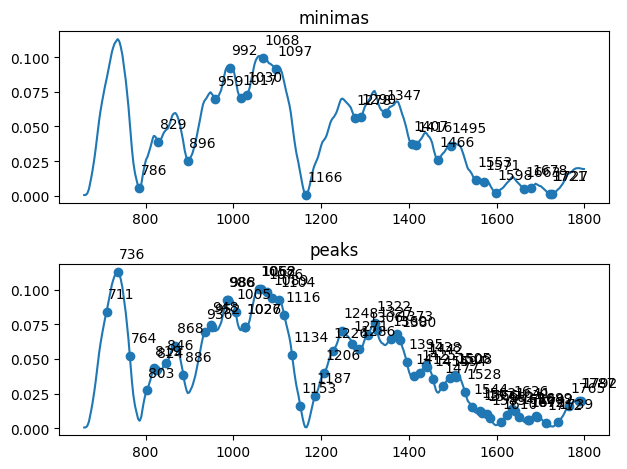

In [100]:
#for now, just focus on control
fig, ax = plt.subplots(2)
x=new_spectral_axis
y = total_spect_per_group["week2"]["control"]
ax[0].plot(new_spectral_axis, total_spect_per_group["week2"]["control"])
minimas, _ = find_peaks(-total_spect_per_group["week2"]["control"])
for minima in minimas:
    ax[0].text(new_spectral_axis[minima]+3, y[minima]+0.01, str(minima+660))

ax[0].scatter(new_spectral_axis[minimas], total_spect_per_group["week2"]["control"][minimas])
ax[0].set_title("minimas")
peaks = find_peaks_and_shoulders(y)[0]
ax[1].plot(x,y)
ax[1].scatter(x[peaks],y[peaks])
for peak in peaks:
    ax[1].text(new_spectral_axis[peak]+3, y[peak]+0.01, str(peak+660))

ax[1].set_title("peaks")
fig.tight_layout()
plt.show()

Figure saved as: spectrum to fit.png


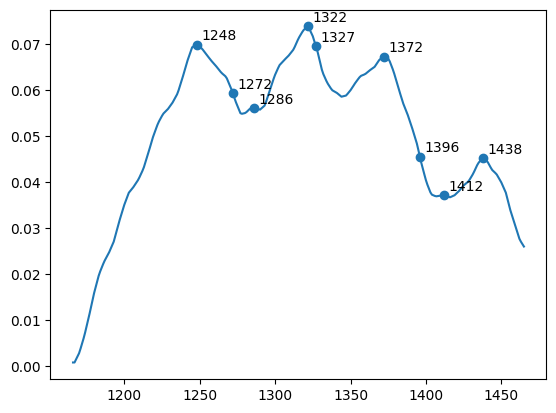

In [126]:
x = new_spectral_axis[1166-660:1466-660]
y = total_spect_per_group["week2"]["50"][1166-660:1466-660]

plt.plot(x,y)
peaks = find_peaks_and_shoulders(y, x=x, p=(0.000001,0.001))[0]
for peak in peaks:
    plt.text(x[peak]+3, y[peak]+0.001, str(peak+1166))
plt.scatter(x[peaks],y[peaks])

save_figure("spectrum to fit")

In [127]:
init_guesses = peaks + 1166
peaks

array([ 82, 106, 120, 156, 161, 206, 230, 246, 272])

In [128]:
#use a constant as the background
model=ConstantModel()
params=model.make_params()
params['c'].set(0.001,min=0, max=0.01)

ls = []
ps = []
for i in range(len(init_guesses)):
    #define parameters for each model
    guess_index = init_guesses[i]
    guess_amplitude = y[guess_index-1166]
    pref = "l" + str(i+1) + "_"
    #define model
    ls.append(GaussianModel(prefix = pref)) #lorentsians
    ps.append(ls[i].make_params()) # params
    ps[i][pref+"center"].set(guess_index, min = guess_index-10, max = guess_index+10)
    ps[i][pref+"amplitude"].set(guess_amplitude, min=0)


In [129]:
for l in ls:
    model = model + l

for p in ps:
    params.update(p)

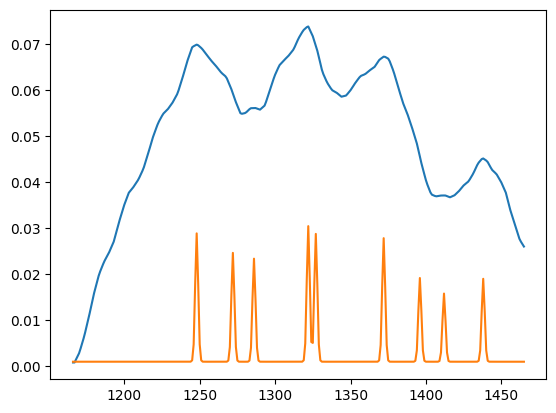

In [130]:
init = model.eval(params = params, x = x)
plt.plot(x,y)
plt.plot(x,init)

In [131]:
result = model.fit(data = y, params = params, x = x)
comps = result.eval_components()

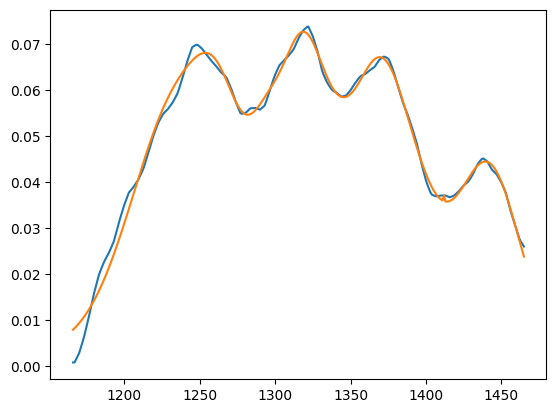

In [132]:
plt.plot(x,y)
plt.plot(x, result.best_fit)

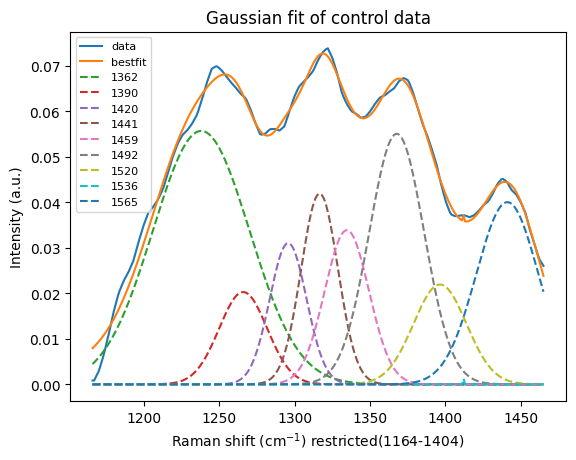

In [133]:
plt.plot(x,y, label="data")
plt.plot(x, result.best_fit, label = "bestfit")
for name, comp in comps.items():
    if name == "constant":
        #plt.plot(x, comp,'--')
        pass
        
        
    else:
        plt.plot(x,comp, '--', label=str(np.argmax(comp)+1290))
        
plt.legend(fontsize=8)
plt.xlabel(r'Raman shift (cm$^{-1}$) restricted(1164-1404)')
plt.ylabel(r'Intensity (a.u.)')
plt.title("Gaussian fit of control data")
#save_figure("gaussianfit")
plt.show()

# finding shoulders

In [25]:
from scipy.signal import savgol_filter

In [37]:
def find_peaks_and_shoulders(y, p=(0.0005, 0.00005)): # y is an array
    x = new_spectral_axis
    dy = np.diff(y)
    dx = np.diff(x)
    d = dy/dx
    smoothed = savgol_filter(d, window_length=30, polyorder=9)
    shoulders = find_peaks(-smoothed, prominence = p[0])[0]

    peaks_ = find_peaks(y, prominence = p[0])[0]
    shoulders = find_peaks(-smoothed, prominence = p[1])[0]

    peaks_and_shoulders = np.sort(np.concatenate((peaks_,shoulders)))
    return (peaks_and_shoulders, d)

Figure saved as: spectrum and shoulders for week4 salt.png


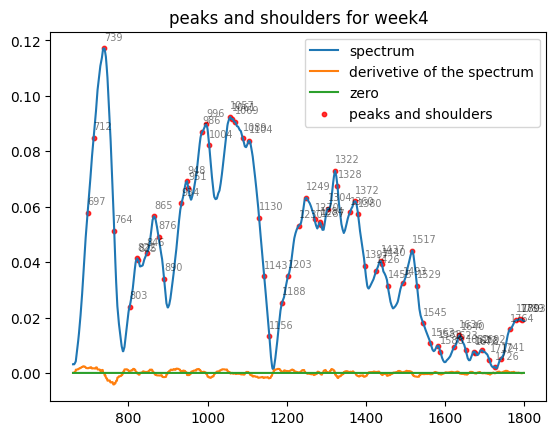

In [39]:
#visulasing peaks and shoulders

week = "week4"
x = new_spectral_axis
df = pd.DataFrame(total_spect_per_group[week]) 

spect_list = list(total_spect_per_group[week].values()) 

mean = np.mean(spect_list, axis=0)
peaks, d = find_peaks_and_shoulders(mean)

plt.plot(x, mean, label = "spectrum")
plt.plot(x[:-1],d, label = "derivetive of the spectrum")
plt.plot(x,np.zeros(len(x)), label = "zero")

for peak in peaks:
    plt.text(x[peak], mean[peak] + 0.003, str(x[peak]), fontsize = 7, alpha = 0.5)


"""plt.scatter(new_spectral_axis[shoulders+1],y[shoulders], s = 10, alpha= 0.8, c = "red")
plt.scatter(new_spectral_axis[peaks],y[peaks], s = 10, alpha= 0.8, c = "red")"""

plt.scatter(x[peaks],mean[peaks], s = 10, alpha= 0.8, c = "red", label = "peaks and shoulders", marker = "o")
plt.title(f"peaks and shoulders for {week}")
plt.legend()
save_figure(f"spectrum and shoulders for {week} salt")


# violin plots including shoulders

64
[[ 0  1  2  3  4  5  6  7]
 [ 8  9 10 11 12 13 14 15]
 [16 17 18 19 20 21 22 23]
 [24 25 26 27 28 29 30 31]
 [32 33 34 35 36 37 38 39]
 [40 41 42 43 44 45 46 47]
 [48 49 50 51 52 53 54 55]
 [56 57 58 59 60 61 62 63]
 [64 65 66 67 68 69 70 71]]
Figure saved as: violin_plots_peakand_shoulders_shift_salt_week4.png


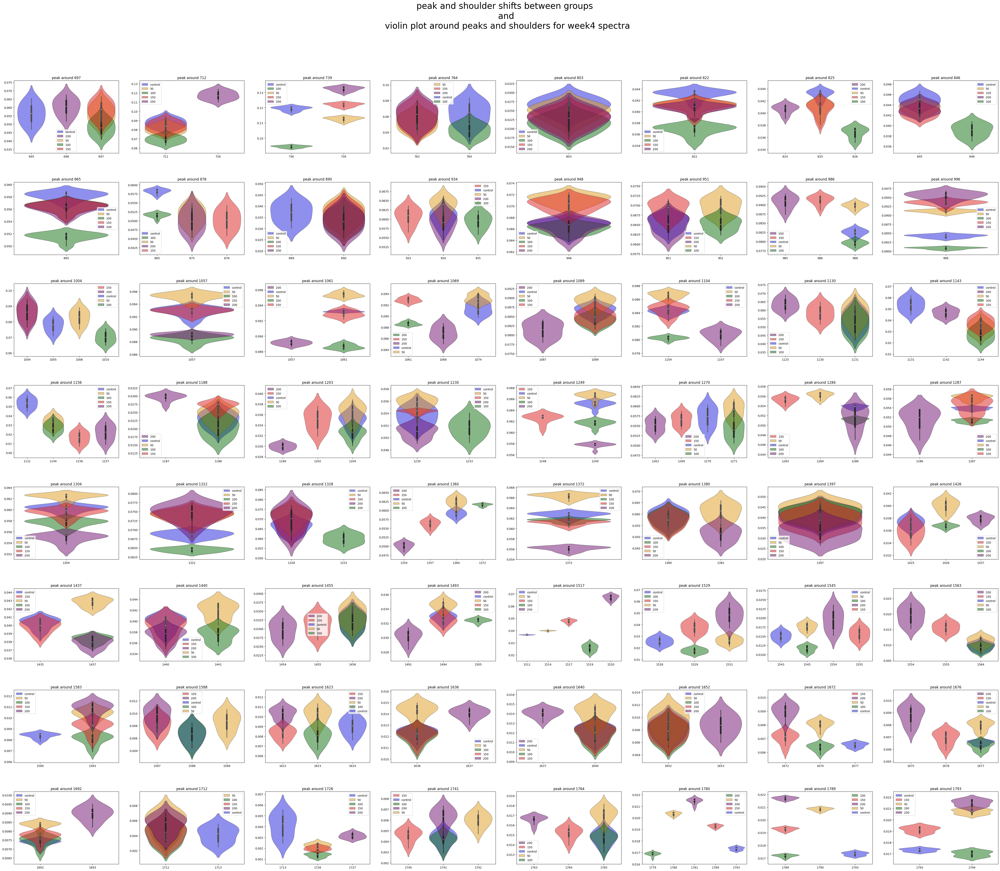

In [51]:
#change variable week to analyse different week

week = "week4"

df = pd.DataFrame(total_spect_per_group[week]) #

spect_list = list(total_spect_per_group[week].values()) #

mean = np.mean(spect_list, axis=0)
peaks, d = find_peaks_and_shoulders(mean)

#finding shoulders





#minimas = find_peaks(-mean, prominence=0.005)[0]
#extremums = np.sort(np.concatenate((minimas, peaks)))
#peak_indexes = ([int(np.where(extremums==peaks[i])[0][0]) for i in range(len(peaks))])
peaks_group = {}
for i, group in enumerate(spectral_dicts[week]): #
    peaks_group[group] = find_peaks_and_shoulders(total_spect_per_group[week][group])[0] #

print(len(peaks))

color_code = {"control": "blue", "50": "orange", "100": "green", "150": "red", "200": "purple"}

"""print(extremums)
print(peak_indexes)"""

ncols= 8
nrows= len(peaks) // ncols + 1

cols = np.zeros(ncols)
rows = np.ones(nrows)

a = np.arange(ncols*nrows)  #dummy array a
a = a.reshape(nrows,ncols)
row, col = np.where(a==2)
row, col = row[0], col[0]

print(a)

fig,axes=plt.subplots(nrows,ncols, figsize = (48,48))

for i in range(len(peaks)):
    peak_mean = peaks[i]
    #print(peak, i)
    peaks_dict = closest_peak(peaks_group, peak_mean) # şu değişkenin ismini daha iyi ayarla peaks_
    row, col = np.where(a==i)
    row, col = row[0], col[0]

    for group in peaks_dict:
        peak = peaks_dict[group]
        sns.violinplot(x = peak + 660, y = df[group][peak-5: peak+5], ax= axes[row,col],
                       label = group, alpha = 0.5, color = color_code[group]) # violin plot için
                                                            #seçilen aralığı neye göre seçeceğim  
    axes[row,col].set_title(f"peak around {peak_mean + 660}")
    axes[row,col].set_ylabel("")



#del unnecessary axes
j = 0
for r in range(nrows):
    for c in range(ncols):
        j += 1
        if j > len(peaks):
            fig.delaxes(axes[r, c])


plt.legend()

fig.suptitle(f"peak and shoulder shifts between groups \n and \n violin plot around peaks and shoulders for {week} spectra",fontsize = 30)
plt.subplots_adjust(left=0, bottom=0, right=1, top=0.9, wspace=0.2, hspace=0.4)
save_figure(f"violin_plots_peakand_shoulders_shift_salt_{week}")
plt.show()


68
[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]
 [25 26 27 28 29]
 [30 31 32 33 34]
 [35 36 37 38 39]
 [40 41 42 43 44]
 [45 46 47 48 49]
 [50 51 52 53 54]
 [55 56 57 58 59]
 [60 61 62 63 64]
 [65 66 67 68 69]]
13 3
69
13 4
70
Figure saved as: violin_plots_peaks_and_shoulders_comparison_between weeks.png


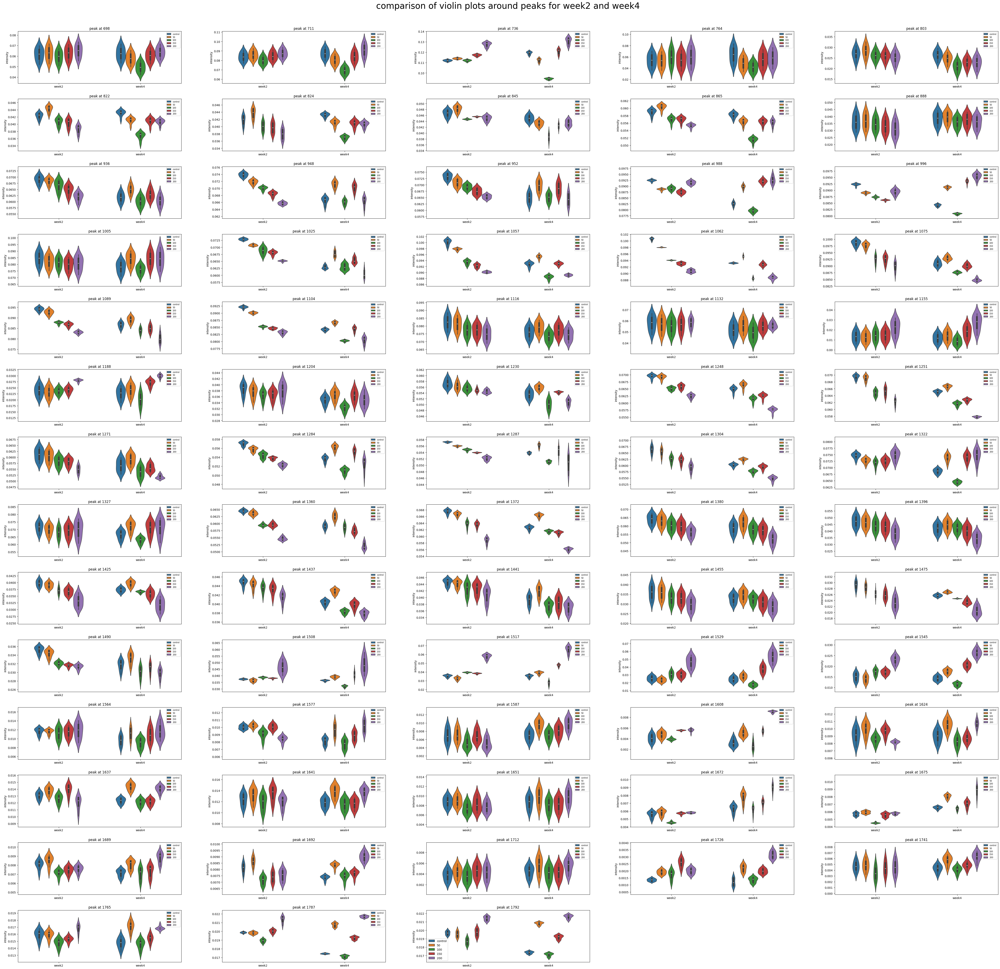

In [42]:
#minimas = find_peaks(-mean, prominence=0.005)[0]
mean_all = np.mean(df_data["spectra"], axis = 0)

peaks = find_peaks_and_shoulders(mean_all)[0]
#extremums = np.sort(np.concatenate((minimas, peaks)))
#peak_indexes = ([int(np.where(extremums==peaks[i])[0][0]) for i in range(len(peaks))])

print(len(peaks))

"""print(extremums)
print(peak_indexes)"""

ncols= 5
nrows= len(peaks) // ncols + 1

cols = np.zeros(ncols)
rows = np.ones(nrows)

a = np.arange(ncols*nrows)  #dummy array a
a = a.reshape(nrows,ncols)
row, col = np.where(a==2)
row, col = row[0], col[0]

print(a)

fig,axes=plt.subplots(nrows,ncols, figsize = (48,48))

for i in range(len(peaks)):
    peak = peaks[i]

    row, col = np.where(a==i)
    row, col = row[0], col[0]



    
    df_long_region = create_cropped_long_data(df_data, peak-5, peak+5)
    
    sns.violinplot(x = "week",
                   y = "intensity", 
                   hue = "group",
                   data = df_long_region,
                   width = 0.6,
                   ax= axes[row,col]) # violin plot için
                                                            #seçilen aralığı neye göre seçeceğim    
    axes[row,col].set_title(f"peak at {peak + 660}")
    plt.xlabel("adfb")

    axes[row,col].legend(fontsize = 7)

    axes[row,col].set_xlabel("")




#del unnecessary axes
j = 0
for r in range(nrows):
    for c in range(ncols):
        j += 1
        if j > len(peaks):
            print(r,c)
            print(j)
            fig.delaxes(axes[r, c])


plt.legend()

fig.suptitle("comparison of violin plots around peaks for week2 and week4", fontsize = 30)
plt.subplots_adjust(left=0, bottom=0, right=1, top=0.95, wspace=0.25, hspace=0.3)


save_figure("violin_plots_peaks_and_shoulders_comparison_between weeks")
plt.show()


64
[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]
 [25 26 27 28 29]
 [30 31 32 33 34]
 [35 36 37 38 39]
 [40 41 42 43 44]
 [45 46 47 48 49]
 [50 51 52 53 54]
 [55 56 57 58 59]
 [60 61 62 63 64]]
12 4
65


/var/folders/nf/nwf8pwq56kl60_ls522kmwgc0000gn/T/ipykernel_1440/853770100.py:58: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Figure saved as: violin_plots_shoulders_week2.png


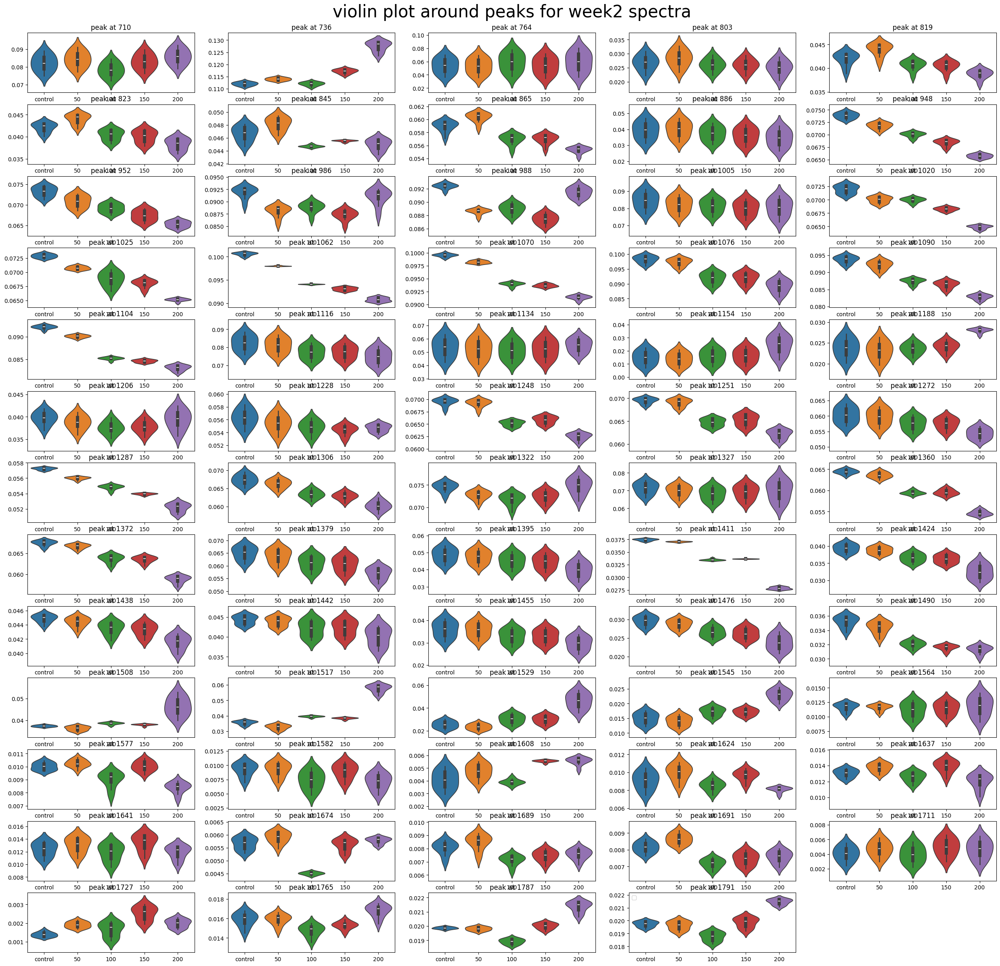

In [48]:
#change week variable to analyse different week data

week = "week2"

df = pd.DataFrame(total_spect_per_group[week])

spect_list = list(total_spect_per_group[week].values())

mean = np.mean(spect_list, axis=0)
peaks = find_peaks_and_shoulders(mean)[0]
#extremums = np.sort(np.concatenate((minimas, peaks)))
#peak_indexes = ([int(np.where(extremums==peaks[i])[0][0]) for i in range(len(peaks))])

print(len(peaks))

"""print(extremums)
print(peak_indexes)"""

ncols= 5
nrows= len(peaks) // ncols + 1

cols = np.zeros(ncols)
rows = np.ones(nrows)

a = np.arange(ncols*nrows)  #dummy array a
a = a.reshape(nrows,ncols)
row, col = np.where(a==2)
row, col = row[0], col[0]

print(a)

fig,axes=plt.subplots(nrows,ncols, figsize = (24,24))

for i in range(len(peaks)):
    peak = peaks[i]
    #print(peak, i)

    row, col = np.where(a==i)
    row, col = row[0], col[0]
    
    sns.violinplot(df[peak-5: peak+5], ax= axes[row,col]) # violin plot için
                                                            #seçilen aralığı neye göre seçeceğim    
    axes[row,col].set_title(f"peak at {peak + 660}")



#del unnecessary axes
j = 0
for r in range(nrows):
    for c in range(ncols):
        j += 1
        if j > len(peaks):
            print(r,c)
            print(j)
            fig.delaxes(axes[r, c])


plt.legend()

fig.suptitle(f"violin plot around peaks for {week} spectra",fontsize = 30)
plt.subplots_adjust(left=0, bottom=0, right=1, top=0.95, wspace=0.2, hspace=0.2)
save_figure(f"violin_plots_shoulders_{week}")
plt.show()
